#### Build Bag of words model 

In [ ]:
descp_title = [" ".join(token) for token in descp_title]

In [ ]:
descp_title

['plant engineer established manufacturer supplier quality water treatment plants ranging basic water softeners reverse osmosis equipment customer complex water treatment solutions meet clients requirements flexibility tailoring product budgets due expansion increased workload seeking recruit planet engineer cover accounts corridor responsibilities include conducting routine sampling analysis water systems interpreting results maintenance installation chemical dosing systems servicing accounts industrial commercial industries complete accordance approved code practice ideal applicant minimum years relevant industry reverse osmosis water softeners water filters uv equipment full driving license return offering competitive package ideal',
 'residential care worker timeout children homes rapidly expanding forefront therapeutic care young people aged years emotional behavioural difficulties lives recruit residential care workers homes swindon area collaboratively cooperatively timeout staf

In [ ]:
# create an instance of CountVectorizer to train bag of words model
# the vocabulary should be the vocab that we created
cVectorizer_combine = CountVectorizer(analyzer = "word", vocabulary = vocab_combine, binary=False)

In [ ]:
cVectorizer_combine 

CountVectorizer(vocabulary=["a'level", 'aa', 'aaa', 'aaappointments', 'aab',
                            'aac', 'aacc', 'aae', 'aah', 'aak', 'aamm', 'aan',
                            'aand', 'aantrekkelijk', 'aap', 'aar', 'aarca',
                            'aardman', 'aareon', 'aaron', 'aaronwallis',
                            'aarosette', 'aarosettehotel', 'aarosettelivein',
                            'aarosetterestaurant', 'aarosetterestaurantlondon',
                            'aarosettes',
                            'aarosettesinternationalchainofhotels',
                            'aarosetteslivein', 'aasl', ...])

In [ ]:
# fit the model on job descriptions
count_features_combine = cVectorizer_combine.fit_transform(descp_title)

In [ ]:
count_features_combine.shape

(55449, 40765)

In [ ]:
count_features_combine

<55449x40765 sparse matrix of type '<class 'numpy.int64'>'
	with 4767585 stored elements in Compressed Sparse Row format>

In [ ]:
# a method to validate count features or tfidf features generated for a given job index

def validator(data_features, vocab, a_ind, tokenised_articles):
    
    # print out the tokens of the job
    print("Tokens: \n")
    print(tokenised_articles[a_ind])
    
    print("--------------------------------------------\n")
    
    print("Vector representation:\n") 
    
    for word, value in zip(vocab, data_features.toarray()[a_ind]): 
        if value > 0:
            print(word+":"+str(value), end =' ')
                       

In [ ]:
validator(count_features_combine, vocab_combine, 10, descp_title)

Tokens: 

project aspnet leicester behalf stable global leicester hunt project background point career developer ideally coming asp net background project managers due sheer growth project responsible defining scope projects resource requirements project governance accountable end end delivery risk managing relationships partners suppliers develop communication strategy engage stakeholders maintain wider track record project ideally qualified prince line beneficial delivering range systems intelligence data warehousing distribution transportation systems ideally areas past tangible developing realworld data driven applications opposed fancy websites gained industry complete software lifecycle preferably multiple methodology models agile practices methodologies test driven scrum savvy credibility front senior managers equally stuff technically asp net ensure continually challenged giving full projects involved ready interview immediately keen real passion drive offer applicant intereste

In [ ]:
# generate tdidf vectors for generating weighted word embeddings of decriptions

tVectorizer_combine = TfidfVectorizer(analyzer = "word", vocabulary = vocab_combine) # initialised the TfidfVectorizer

tfidf_features_combine = tVectorizer_combine.fit_transform(descp_title) # generate the tfidf vector representation for all articles

tfidf_features_combine.shape

(55449, 40765)

In [ ]:
tfidf_features_combine

<55449x40765 sparse matrix of type '<class 'numpy.float64'>'
	with 4767585 stored elements in Compressed Sparse Row format>

In [ ]:
# save the generated tfidf vectors to train the weighted models later in the tasks

def write_vectorFile_further(data_features,filename):
    
    # the number of document
    num = data_features.shape[0] 
    
    # creates a txt file and open to save the vector representation
    out_file = open(filename, 'w') 
    
    for a_ind in range(0, num): # loop through each description by index
        
        # for each word index that has non-zero entry in the data_feature
        for f_ind in data_features[a_ind].nonzero()[1]: 
            
            # retrieve the value of the entry from data_features
            value = data_features[a_ind][0,f_ind] 
            
            # write the entry to the file in the format of word_index:value
            out_file.write("{}:{} ".format(f_ind,value)) 
               
        out_file.write('\n')
        
    out_file.close() 

In [ ]:
write_vectorFile_further(tfidf_features_combine, "tfidf_combine.txt")

In [ ]:
write_vectorFile_further(count_features_combine, "count_combine.txt")

#### methods to assist building weighted and unweighted models

In [ ]:
# we will need to create a corpus of all the tokenized and pre-processed job description for further use in the task

with open("corpus_combine.txt", "w") as file:
    
    for i in range(0, len(descp_title)):
        file.write(descp_title[i] + "\n")

In [ ]:
# method to generate vector representation for documents - unweighted
def gen_docVecs(wv, tk_txts): 
    
    # creating empty final dataframe
    docs_vectors = pd.DataFrame()

    for i in range(0, len(tk_txts)):
        tokens = tk_txts[i]
        
        # creating a temporary dataframe(store value for 1st doc & for 2nd doc remove the details of 1st & proced through 2nd and so on..)
        temp = pd.DataFrame()  
        
        # looping through each word of a single document and spliting through space
        for w_ind in range(0, len(tokens)): 
            try:
                word = tokens[w_ind]
                
                # if word is present in embeddings(goole provides weights associate with words(300)) then proceed
                word_vec = wv[word] 
                
                # if word is present then append it to temporary dataframe
                temp = temp.append(pd.Series(word_vec), ignore_index = True) 
            except:
                pass
            
        # take the sum of each column    
        doc_vector = temp.sum() 
        
        # append each document value to the final dataframe
        docs_vectors = docs_vectors.append(doc_vector, ignore_index = True) 
    return docs_vectors

In [ ]:
filename = 'corpus_combine.txt'

with open(filename) as txtf:
    description_txts = txtf.read().splitlines() # reading a list of strings, each for a document/article
tokenized_description_title = [a.split(' ') for a in description_txts]


In [ ]:
tokenized_description_title

[['plant',
  'engineer',
  'established',
  'manufacturer',
  'supplier',
  'quality',
  'water',
  'treatment',
  'plants',
  'ranging',
  'basic',
  'water',
  'softeners',
  'reverse',
  'osmosis',
  'equipment',
  'customer',
  'complex',
  'water',
  'treatment',
  'solutions',
  'meet',
  'clients',
  'requirements',
  'flexibility',
  'tailoring',
  'product',
  'budgets',
  'due',
  'expansion',
  'increased',
  'workload',
  'seeking',
  'recruit',
  'planet',
  'engineer',
  'cover',
  'accounts',
  'corridor',
  'responsibilities',
  'include',
  'conducting',
  'routine',
  'sampling',
  'analysis',
  'water',
  'systems',
  'interpreting',
  'results',
  'maintenance',
  'installation',
  'chemical',
  'dosing',
  'systems',
  'servicing',
  'accounts',
  'industrial',
  'commercial',
  'industries',
  'complete',
  'accordance',
  'approved',
  'code',
  'practice',
  'ideal',
  'applicant',
  'minimum',
  'years',
  'relevant',
  'industry',
  'reverse',
  'osmosis',
  '

In [ ]:
df = pd.read_csv('ids_categories.csv')

In [ ]:
df.head()

,Unnamed: 0,Job_ID,Category
0,0,14624,Engineering
1,1,31567,Healthcare_Nursing
2,2,50131,Hospitality_Catering
3,3,31419,Healthcare_Nursing
4,4,47238,Teaching


In [ ]:
df.drop("Unnamed: 0", axis=1, inplace= True)

In [ ]:
df['job_text'] = descp_title

In [ ]:
df['tk_text'] = tokenized_description_title

In [ ]:
df.sample(n = 5)

,Job_ID,Category,job_text,tk_text
17459,3302,IT,rf microwave ic design engineer rf microwave i...,"[rf, microwave, ic, design, engineer, rf, micr..."
9605,18153,Engineering,electrical design engineer sheffield summary p...,"[electrical, design, engineer, sheffield, summ..."
1707,19723,Engineering,engineering projects pharmaceutical equipment ...,"[engineering, projects, pharmaceutical, equipm..."
16375,33485,Healthcare_Nursing,allied health care professional optometrists j...,"[allied, health, care, professional, optometri..."
21420,52283,Hospitality_Catering,youth caf officer grade hours week temporary m...,"[youth, caf, officer, grade, hours, week, temp..."


In [ ]:
def plotTSNE(labels,features): # features as a numpy array, each element of the array is the document embedding of an article
    categories = sorted(labels.unique())
    # Sampling a subset of our dataset because t-SNE is computationally expensive
    SAMPLE_SIZE = int(len(features) * 0.3)
    np.random.seed(0)
    indices = np.random.choice(range(len(features)), size=SAMPLE_SIZE, replace=False)
    projected_features = TSNE(n_components=2, random_state=0).fit_transform(features[indices])
    colors = ['pink', 'green', 'midnightblue', 'orange', 'darkgrey', 'red', 'blue', 'black']
    for i in range(0,len(categories)):
        points = projected_features[(labels[indices] == categories[i])]
        plt.scatter(points[:, 0], points[:, 1], s=30, c=colors[i], label=categories[i])
    plt.title("Feature vector for each article, projected on 2 dimensions.",
              fontdict=dict(fontsize=15))
    plt.legend()
    plt.show()

In [ ]:
def gen_vocIndex(voc_fname):
    with open(voc_fname) as vocf: 
        voc_Ind = [l.split(':') for l in vocf.read().splitlines()] # each line is 'index,word'
    return {int(vi[1]):vi[0] for vi in voc_Ind}


# Generates the w_index:word dictionary
voc_fname = 'vocab_combine.txt' # path for the vocabulary
voc_dict = gen_vocIndex(voc_fname)
voc_dict

{0: "a'level",
 1: 'aa',
 2: 'aaa',
 3: 'aaappointments',
 4: 'aab',
 5: 'aac',
 6: 'aacc',
 7: 'aae',
 8: 'aah',
 9: 'aak',
 10: 'aamm',
 11: 'aan',
 12: 'aand',
 13: 'aantrekkelijk',
 14: 'aap',
 15: 'aar',
 16: 'aarca',
 17: 'aardman',
 18: 'aareon',
 19: 'aaron',
 20: 'aaronwallis',
 21: 'aarosette',
 22: 'aarosettehotel',
 23: 'aarosettelivein',
 24: 'aarosetterestaurant',
 25: 'aarosetterestaurantlondon',
 26: 'aarosettes',
 27: 'aarosettesinternationalchainofhotels',
 28: 'aarosetteslivein',
 29: 'aasl',
 30: 'aasp',
 31: 'aastra',
 32: 'aat',
 33: 'aatom',
 34: 'ab',
 35: 'aba',
 36: 'abab',
 37: 'abacus',
 38: 'abaility',
 39: 'abandoned',
 40: 'abandonment',
 41: 'abandons',
 42: 'abap',
 43: 'abaqus',
 44: 'abatement',
 45: 'abb',
 46: 'abbas',
 47: 'abbey',
 48: 'abbeywood',
 49: 'abbie',
 50: 'abbot',
 51: 'abbots',
 52: 'abbott',
 53: 'abby',
 54: 'abbyy',
 55: 'abc',
 56: 'abd',
 57: 'abdo',
 58: 'abdominal',
 59: 'abdul',
 60: 'abdulla',
 61: 'abel',
 62: 'abellprotocol

In [ ]:
def doc_wordweights(fName_tVectors, voc_dict):
    
    # a list to store the  word:weight dictionaries of documents
    tfidf_weights = [] 
    
    with open(fName_tVectors) as tVecf:
        
        # each line is a tfidf vector representation of a document in string format 'word_index:weight word_index:weight .......'
        tVectors = tVecf.read().splitlines() 
        
    # for each tfidf document vector
    for tv in tVectors: 
        tv = tv.strip()
        
        # list of 'word_index:weight' entries
        weights = tv.split(' ') 
        
        # change the format of weight to a list of '[word_index,weight]' entries
        weights = [w.split(':') for w in weights] 
        
        # construct the weight dictionary, where each entry is 'word:weight'
        wordweight_dict = {voc_dict[int(w[0])]:w[1] for w in weights}
        
        tfidf_weights.append(wordweight_dict) 
        
    return tfidf_weights

In [ ]:
fName_tVectors = 'tfidf_combine.txt'

tfidf_weights = doc_wordweights(fName_tVectors, voc_dict)

In [ ]:
tfidf_weights

[{'years': '0.04134385514488585',
  'workload': '0.07687875261523758',
  'water': '0.5247471296401859',
  'uv': '0.1489617904968609',
  'treatment': '0.1629292483896723',
  'tailoring': '0.12919242631243186',
  'systems': '0.08679948037808438',
  'supplier': '0.07215751982006123',
  'solutions': '0.04589533994016869',
  'softeners': '0.32016624514718145',
  'servicing': '0.08626350234848931',
  'seeking': '0.0499866869638733',
  'sampling': '0.12002368390866563',
  'routine': '0.09272309121438749',
  'reverse': '0.2650478713679671',
  'return': '0.05837019719123919',
  'results': '0.06314184066149875',
  'responsibilities': '0.043978296487933596',
  'requirements': '0.040160517911589096',
  'relevant': '0.04691646602481009',
  'recruit': '0.05213258542111135',
  'ranging': '0.08603494163681223',
  'quality': '0.04140277599510785',
  'product': '0.050976497561088074',
  'practice': '0.057592192181866196',
  'plants': '0.11574169380195376',
  'plant': '0.08016986326025116',
  'planet': '

In [ ]:
# take a look at the tfidf word weights dictionary of the first document
tfidf_weights[0]

{'years': '0.04134385514488585',
 'workload': '0.07687875261523758',
 'water': '0.5247471296401859',
 'uv': '0.1489617904968609',
 'treatment': '0.1629292483896723',
 'tailoring': '0.12919242631243186',
 'systems': '0.08679948037808438',
 'supplier': '0.07215751982006123',
 'solutions': '0.04589533994016869',
 'softeners': '0.32016624514718145',
 'servicing': '0.08626350234848931',
 'seeking': '0.0499866869638733',
 'sampling': '0.12002368390866563',
 'routine': '0.09272309121438749',
 'reverse': '0.2650478713679671',
 'return': '0.05837019719123919',
 'results': '0.06314184066149875',
 'responsibilities': '0.043978296487933596',
 'requirements': '0.040160517911589096',
 'relevant': '0.04691646602481009',
 'recruit': '0.05213258542111135',
 'ranging': '0.08603494163681223',
 'quality': '0.04140277599510785',
 'product': '0.050976497561088074',
 'practice': '0.057592192181866196',
 'plants': '0.11574169380195376',
 'plant': '0.08016986326025116',
 'planet': '0.13380819616620743',
 'pack

In [ ]:
# extended version of the `gen_docVecs` function

def gen_docVecs(wv,tk_txts,tfidf = []): # generate vector representation for documents
    docs_vectors = pd.DataFrame() # creating empty final dataframe
    #stopwords = nltk.corpus.stopwords.words('english') # removing stop words

    for i in range(0,len(tk_txts)):
        tokens = list(set(tk_txts[i])) # get the list of distinct words of the document

        temp = pd.DataFrame()  # creating a temporary dataframe(store value for 1st doc & for 2nd doc remove the details of 1st & proced through 2nd and so on..)
        for w_ind in range(0, len(tokens)): # looping through each word of a single document and spliting through space
            try:
                word = tokens[w_ind]
                word_vec = wv[word] # if word is present in embeddings(goole provides weights associate with words(300)) then proceed
                
                if tfidf != []:
                    word_weight = float(tfidf[i][word])
                else:
                    word_weight = 1
                temp = temp.append(pd.Series(word_vec*word_weight), ignore_index = True) # if word is present then append it to temporary dataframe
            except:
                pass
        doc_vector = temp.sum() # take the sum of each column(w0, w1, w2,........w300)
        docs_vectors = docs_vectors.append(doc_vector, ignore_index = True) # append each document value to the final dataframe
    return docs_vectors

### Generate word embeddings

#### FastText Unweighted --->  title + description

In [ ]:

# 1. Set the corpus file names/path
corpus_file = 'corpus_combine.txt'

# 2. Initialise the Fast Text model
jobAdFT_title_descp = FastText(vector_size=200) 

# 3. build the vocabulary
jobAdFT_title_descp.build_vocab(corpus_file=corpus_file)

# 4. train the model
jobAdFT_title_descp.train(
    corpus_file=corpus_file, epochs=jobAdFT_title_descp.epochs,
    total_examples=jobAdFT_title_descp.corpus_count, total_words=jobAdFT_title_descp.corpus_total_words,
)

print(jobAdFT_title_descp)

FastText(vocab=23133, vector_size=200, alpha=0.025)


In [ ]:
# fetch and assign all the vectors/word embeddings to a new variable

jobAdFT_wv = jobAdFT_title_descp.wv
print(jobAdFT_wv)

In [ ]:
len(jobAdFT_wv)

23133

In [ ]:
# check the embedding of each word
jobAdFT_wv.vector_size

200

In [ ]:
for index, word in enumerate(jobAdFT_wv.index_to_key):
    if index == 10:
        break
    print(f"word #{index}/{len(jobAdFT_wv.index_to_key)} is {word}")

word #0/23133 is sales
word #1/23133 is care
word #2/23133 is technical
word #3/23133 is engineer
word #4/23133 is software
word #5/23133 is design
word #6/23133 is project
word #7/23133 is customer
word #8/23133 is clients
word #9/23133 is systems


In [ ]:
jobAdFT_title_descp.save("jobAdFT.model")

In [ ]:
jobAdFT = FastText.load("jobAdFT.model")

print(jobAdFT)

jobAdFT_wv = jobAdFT.wv

FastText(vocab=23133, vector_size=200, alpha=0.025)


In [ ]:
# generate document embeddings
jobAdFT_dvs = gen_docVecs(jobAdFT_wv, df['tk_text'])

jobAdFT_dvs.isna().any().sum()

0

In [ ]:
jobAdFT_dvs.shape

(55449, 200)

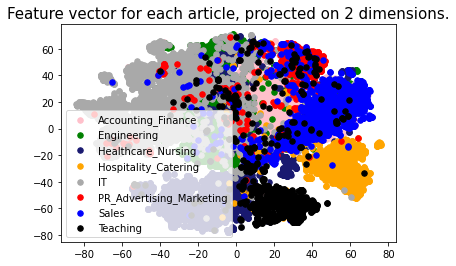

In [ ]:
# explore feature space
features = jobAdFT_dvs.to_numpy()

plotTSNE(df['Category'],features)

<span style='font-family:Georgia;color:Blue;background:yellow'> observation
    
    The clusters seem to be seperate from each other than description and title alone. 
    
    The Engineering and IT shows clear distinguisable boundary with only a few overlaps. 
    
    PR, Sales, and Accounting have clear differences as well.
    
    Title along with description performs better than using only titles or only descriptions. 
    
   
    

In [ ]:
jobAdFT_dvs.to_csv('jobAdFT_dvs_unweighted_combine.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

jobAdFT_dvs = pd.read_csv('jobAdFT_dvs_unweighted_combine.csv')

In [ ]:
jobAdFT_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,190,191,192,193,194,195,196,197,198,199
0,0,43.966553,2.412230,39.481243,15.639233,-42.558792,-0.142178,-4.988434,16.891357,-8.119866,...,47.740490,-46.869312,-70.150650,59.824387,7.157963,17.644114,-64.832600,12.688532,-0.115714,-20.010006
1,1,-26.414766,35.418210,-1.589767,-0.783269,-20.363770,17.348442,24.408033,23.489365,-58.085728,...,17.985040,43.608930,-70.913230,6.089675,-10.624967,13.508617,43.369430,-25.450981,-38.602540,-17.324852
2,2,9.193989,-22.126726,-3.047196,23.905964,-27.391094,12.095854,-22.622420,-18.133533,28.765322,...,-5.137981,-10.496550,2.028582,12.606911,-20.144642,-1.223635,33.510357,31.905690,-8.788617,10.809264
3,3,10.159918,-4.784657,-60.680250,-34.143517,-33.772320,2.812295,16.956890,-2.669374,-60.329388,...,22.498050,7.990395,-75.666670,20.205582,-15.791450,-10.236276,43.488600,-48.109306,-21.461979,-27.588234
4,4,19.904900,-23.517956,-7.870582,-7.310564,-23.599857,22.771513,18.984808,-5.991341,-6.796105,...,18.320618,0.865238,-31.823498,2.065796,-12.407652,-32.041405,-3.078254,-5.883384,-25.994476,3.155874


In [ ]:
jobAdFT_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
jobAdFT_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,43.966553,2.412230,39.481243,15.639233,-42.558792,-0.142178,-4.988434,16.891357,-8.119866,48.689297,...,47.740490,-46.869312,-70.150650,59.824387,7.157963,17.644114,-64.832600,12.688532,-0.115714,-20.010006
1,-26.414766,35.418210,-1.589767,-0.783269,-20.363770,17.348442,24.408033,23.489365,-58.085728,22.225977,...,17.985040,43.608930,-70.913230,6.089675,-10.624967,13.508617,43.369430,-25.450981,-38.602540,-17.324852
2,9.193989,-22.126726,-3.047196,23.905964,-27.391094,12.095854,-22.622420,-18.133533,28.765322,36.435000,...,-5.137981,-10.496550,2.028582,12.606911,-20.144642,-1.223635,33.510357,31.905690,-8.788617,10.809264
3,10.159918,-4.784657,-60.680250,-34.143517,-33.772320,2.812295,16.956890,-2.669374,-60.329388,-23.722084,...,22.498050,7.990395,-75.666670,20.205582,-15.791450,-10.236276,43.488600,-48.109306,-21.461979,-27.588234
4,19.904900,-23.517956,-7.870582,-7.310564,-23.599857,22.771513,18.984808,-5.991341,-6.796105,10.779723,...,18.320618,0.865238,-31.823498,2.065796,-12.407652,-32.041405,-3.078254,-5.883384,-25.994476,3.155874


#### GoogleNews300 unweighted title + description

In [ ]:
preTW2v_dvs = gen_docVecs(preTW2v_wv, df['tk_text'])

preTW2v_dvs.isna().any().sum()

0

In [ ]:
preTW2v_dvs.shape

(55449, 300)

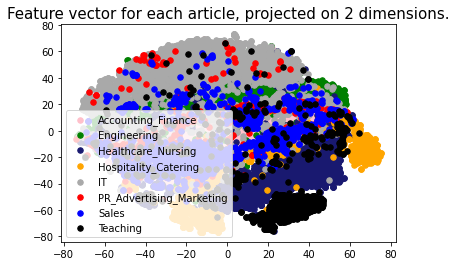

In [ ]:
features = preTW2v_dvs.to_numpy() # convert the document vector dataframe to a numpy array

plotTSNE(df['Category'],features) # plot the tSNE to have a look

<span style='font-family:Georgia;color:Blue;background:yellow'> observation
    
    The GoogleNewsModel is able to distinguish between different clusters well.
    
    Although PR and Sales show blurry boundary between them as compared with unweighted Fastetxt model.
    
    Clusters of Hospitality, Sales, Healthcare and IT show clear distinguisable boundary. 
    

In [ ]:
# saving the dataframe 
preTW2v_dvs.to_csv('GoogleNews300_unweighted_combine.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

preTW2v_dvs = pd.read_csv('GoogleNews300_unweighted_combine.csv')

In [ ]:
preTW2v_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,290,291,292,293,294,295,296,297,298,299
0,0,-3.503983,3.616436,1.695667,3.397507,-4.285907,0.944822,2.041244,-4.036560,2.641541,...,-5.100220,3.146057,-4.538208,4.180985,0.796967,0.523354,1.027252,-0.331451,2.775963,-3.840069
1,1,-1.538849,0.121103,-0.854309,4.101990,-2.661911,0.140926,2.577408,-2.137283,4.245270,...,-3.775551,1.791962,-5.621418,0.853672,-0.761078,1.230164,0.597247,-2.115875,0.726234,-0.679596
2,2,-2.666733,1.599358,-0.897827,4.386200,-1.453510,1.591316,-0.034073,-5.302429,3.339159,...,-2.212471,2.321854,-3.498032,2.107239,0.893967,-1.256256,0.047974,-1.713715,0.644794,-2.281189
3,3,-2.635483,1.141026,0.233490,-0.046021,-1.971451,0.097214,2.019745,-4.772556,4.632248,...,-2.564636,1.540573,-3.080627,2.777988,-1.341522,1.276276,0.118958,-0.497482,2.070480,0.155457
4,4,-1.854736,0.528772,-0.310455,1.653198,-2.018188,-1.287476,2.241333,-4.511353,3.429261,...,-2.552036,2.308228,-2.970006,0.099201,2.324951,-1.027115,0.713961,-2.867897,-0.979614,-1.163574


In [ ]:
preTW2v_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
preTW2v_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-3.503983,3.616436,1.695667,3.397507,-4.285907,0.944822,2.041244,-4.036560,2.641541,2.443306,...,-5.100220,3.146057,-4.538208,4.180985,0.796967,0.523354,1.027252,-0.331451,2.775963,-3.840069
1,-1.538849,0.121103,-0.854309,4.101990,-2.661911,0.140926,2.577408,-2.137283,4.245270,-3.874084,...,-3.775551,1.791962,-5.621418,0.853672,-0.761078,1.230164,0.597247,-2.115875,0.726234,-0.679596
2,-2.666733,1.599358,-0.897827,4.386200,-1.453510,1.591316,-0.034073,-5.302429,3.339159,2.063503,...,-2.212471,2.321854,-3.498032,2.107239,0.893967,-1.256256,0.047974,-1.713715,0.644794,-2.281189
3,-2.635483,1.141026,0.233490,-0.046021,-1.971451,0.097214,2.019745,-4.772556,4.632248,-2.953369,...,-2.564636,1.540573,-3.080627,2.777988,-1.341522,1.276276,0.118958,-0.497482,2.070480,0.155457
4,-1.854736,0.528772,-0.310455,1.653198,-2.018188,-1.287476,2.241333,-4.511353,3.429261,0.319550,...,-2.552036,2.308228,-2.970006,0.099201,2.324951,-1.027115,0.713961,-2.867897,-0.979614,-1.163574


#### FastText Weighted --> title + description

In [ ]:
weighted_jobAdFT_dvs = gen_docVecs(jobAdFT_wv, df['tk_text'], tfidf_weights)

In [ ]:
weighted_jobAdFT_dvs.shape

(55449, 200)

In [ ]:
weighted_jobAdFT_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,2.928180,0.755896,4.125231,1.214472,-2.547303,0.016770,-0.384118,1.208666,-0.360407,3.172183,...,3.335427,-3.525449,-4.668137,4.347139,0.669106,1.850718,-4.567778,0.053941,0.182776,-0.851154
1,-2.845365,2.956259,-0.437568,0.357851,-1.268400,2.374883,1.804719,1.302832,-5.765912,1.927296,...,1.690002,3.574784,-6.609153,0.285941,-1.010019,1.357839,4.010597,-2.119635,-3.058808,-1.630591
2,0.055290,-2.163355,0.452660,2.435444,-2.168522,1.250604,-2.222244,-2.958654,3.790922,2.890681,...,-0.912578,-1.041681,1.170115,1.123103,-2.264253,0.568959,3.381612,2.731423,-0.313606,1.324230
3,0.091208,0.107125,-4.651918,-3.538827,-2.207789,0.472319,1.428605,-0.864574,-4.768573,-2.222586,...,1.355508,0.362379,-5.628305,1.987155,-1.359214,-0.127499,3.536230,-4.575963,-1.496257,-1.872885
4,2.104263,-2.978553,-0.653408,-0.557803,-2.800791,2.649867,2.346873,-1.292986,-1.026994,0.865236,...,2.279632,-0.167490,-2.629904,-0.146372,-1.551691,-3.481757,-0.320376,-1.386551,-2.062284,0.205036


In [ ]:
features = weighted_jobAdFT_dvs.to_numpy()

plotTSNE(df['Category'], features)

In [ ]:
# save the generated dataframe into csv file
weighted_jobAdFT_dvs.to_csv('jobAdFT_dvs_weighted_combine.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

weighted_jobAdFT_dvs = pd.read_csv('jobAdFT_dvs_weighted_combine.csv')

In [ ]:
weighted_jobAdFT_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,190,191,192,193,194,195,196,197,198,199
0,0,2.928180,0.755896,4.125231,1.214472,-2.547303,0.016770,-0.384118,1.208666,-0.360407,...,3.335427,-3.525449,-4.668137,4.347139,0.669106,1.850718,-4.567778,0.053941,0.182776,-0.851154
1,1,-2.845365,2.956259,-0.437568,0.357851,-1.268400,2.374883,1.804719,1.302832,-5.765912,...,1.690002,3.574784,-6.609153,0.285941,-1.010019,1.357839,4.010597,-2.119635,-3.058808,-1.630591
2,2,0.055290,-2.163355,0.452660,2.435444,-2.168522,1.250604,-2.222243,-2.958654,3.790922,...,-0.912578,-1.041681,1.170115,1.123103,-2.264253,0.568959,3.381612,2.731423,-0.313606,1.324230
3,3,0.091208,0.107125,-4.651918,-3.538827,-2.207789,0.472319,1.428605,-0.864574,-4.768573,...,1.355508,0.362379,-5.628305,1.987155,-1.359214,-0.127499,3.536230,-4.575963,-1.496257,-1.872885
4,4,2.104263,-2.978553,-0.653408,-0.557803,-2.800791,2.649867,2.346873,-1.292986,-1.026995,...,2.279632,-0.167490,-2.629904,-0.146372,-1.551691,-3.481757,-0.320376,-1.386551,-2.062284,0.205036


In [ ]:
weighted_jobAdFT_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
weighted_jobAdFT_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,2.928180,0.755896,4.125231,1.214472,-2.547303,0.016770,-0.384118,1.208666,-0.360407,3.172183,...,3.335427,-3.525449,-4.668137,4.347139,0.669106,1.850718,-4.567778,0.053941,0.182776,-0.851154
1,-2.845365,2.956259,-0.437568,0.357851,-1.268400,2.374883,1.804719,1.302832,-5.765912,1.927296,...,1.690002,3.574784,-6.609153,0.285941,-1.010019,1.357839,4.010597,-2.119635,-3.058808,-1.630591
2,0.055290,-2.163355,0.452660,2.435444,-2.168522,1.250604,-2.222243,-2.958654,3.790922,2.890681,...,-0.912578,-1.041681,1.170115,1.123103,-2.264253,0.568959,3.381612,2.731423,-0.313606,1.324230
3,0.091208,0.107125,-4.651918,-3.538827,-2.207789,0.472319,1.428605,-0.864574,-4.768573,-2.222586,...,1.355508,0.362379,-5.628305,1.987155,-1.359214,-0.127499,3.536230,-4.575963,-1.496257,-1.872885
4,2.104263,-2.978553,-0.653408,-0.557803,-2.800791,2.649867,2.346873,-1.292986,-1.026995,0.865236,...,2.279632,-0.167490,-2.629904,-0.146372,-1.551691,-3.481757,-0.320376,-1.386551,-2.062284,0.205036


#### GoogleNews300 Weighted ---> title + description

In [ ]:
weighted_preTW2v_dvs = gen_docVecs(preTW2v_wv, df['tk_text'], tfidf_weights)

In [ ]:
weighted_preTW2v_dvs.shape

(55449, 300)

In [ ]:
# save the generated dataframe into csv file
weighted_preTW2v_dvs.to_csv('GoogleNews300_weighted_combine.csv') 

In [ ]:
# read the csv file into a dataframe when the notebook restarts

weighted_preTW2v_dvs = pd.read_csv('GoogleNews300_weighted_combine.csv')

In [ ]:
weighted_preTW2v_dvs.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,290,291,292,293,294,295,296,297,298,299
0,0,-0.286519,0.524510,0.345788,0.240581,-0.567380,0.218193,0.008393,-0.502797,0.164262,...,-0.379372,0.260197,-0.379357,0.343339,-0.045623,-0.040472,-0.193443,0.016092,0.513936,-0.133195
1,1,-0.019124,-0.001597,0.086453,0.512885,-0.282787,-0.124220,0.409733,-0.502976,0.561582,...,-0.417486,0.126815,-0.692737,-0.037807,0.033325,0.122974,-0.006669,-0.169311,0.042044,-0.081549
2,2,-0.299697,0.076542,0.031979,0.398632,-0.090547,0.112908,-0.126313,-0.576687,0.393858,...,-0.138170,0.243658,-0.373385,0.377912,0.211614,-0.173225,0.006181,-0.350393,0.177635,-0.147095
3,3,-0.460329,0.252638,0.067213,0.027119,-0.189881,0.073052,-0.005546,-0.330742,0.427193,...,-0.318174,0.087544,-0.409577,0.395950,-0.127423,0.117041,-0.164227,0.003795,0.297592,0.260016
4,4,-0.238011,0.077605,0.089373,0.443059,-0.221564,-0.199055,0.385051,-0.627890,0.371062,...,-0.355942,0.285580,-0.519215,0.089674,0.444054,-0.104573,0.182774,-0.476303,0.109493,0.001398


In [ ]:
features = weighted_preTW2v_dvs.to_numpy()

plotTSNE(df['Category'], features)

In [ ]:
weighted_preTW2v_dvs.drop("Unnamed: 0", axis=1, inplace=True)

In [ ]:
weighted_preTW2v_dvs.head()

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.286519,0.524510,0.345788,0.240581,-0.567380,0.218193,0.008393,-0.502797,0.164262,0.231138,...,-0.379372,0.260197,-0.379357,0.343339,-0.045623,-0.040472,-0.193443,0.016092,0.513936,-0.133195
1,-0.019124,-0.001597,0.086453,0.512885,-0.282787,-0.124220,0.409733,-0.502976,0.561582,-0.645707,...,-0.417486,0.126815,-0.692737,-0.037807,0.033325,0.122974,-0.006669,-0.169311,0.042044,-0.081549
2,-0.299697,0.076542,0.031979,0.398632,-0.090547,0.112908,-0.126313,-0.576687,0.393858,0.286826,...,-0.138170,0.243658,-0.373385,0.377912,0.211614,-0.173225,0.006181,-0.350393,0.177635,-0.147095
3,-0.460329,0.252638,0.067213,0.027119,-0.189881,0.073052,-0.005546,-0.330742,0.427193,-0.364111,...,-0.318174,0.087544,-0.409577,0.395950,-0.127423,0.117041,-0.164227,0.003795,0.297592,0.260016
4,-0.238011,0.077605,0.089373,0.443059,-0.221564,-0.199055,0.385051,-0.627890,0.371062,-0.064255,...,-0.355942,0.285580,-0.519215,0.089674,0.444054,-0.104573,0.182774,-0.476303,0.109493,0.001398


In [ ]:
# we observe that there are 8 categories and It has the highest number of job files in the data folder

stats = df_labels.groupby('Category').count()
print(stats)

                          jobID
Category                       
Accounting_Finance         7407
Engineering                8210
Healthcare_Nursing         8808
Hospitality_Catering       4788
IT                        14353
PR_Advertising_Marketing   2755
Sales                      5349
Teaching                   3779


<AxesSubplot:xlabel='Category'>

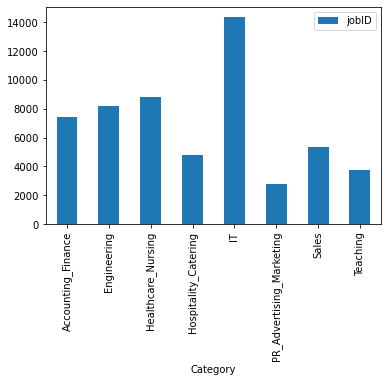

In [ ]:
stats.plot.bar(ylim=0)

In [ ]:
def gen_labels(aid_fname, df_labels):
    
    # create empty label list
    labels = [] 
    
    with open(aid_fname) as lf: 
        job_ids = lf.read().splitlines() 
        
    # for each document ID
    for aid in job_ids: 
        
        # append the corresponding label to the label list
        labels.append(df_labels.loc[df_labels.jobID == int(aid)].Category.squeeze()) 
        
    # return the list of labels and the list of document ids
    return labels, job_ids 


In [ ]:
labels, job_ids = gen_labels("job_IDs.txt", df_labels)


In [ ]:
labels

['Engineering',
 'Healthcare_Nursing',
 'Hospitality_Catering',
 'Healthcare_Nursing',
 'Teaching',
 'Healthcare_Nursing',
 'Healthcare_Nursing',
 'PR_Advertising_Marketing',
 'IT',
 'Sales',
 'IT',
 'IT',
 'Healthcare_Nursing',
 'IT',
 'Hospitality_Catering',
 'IT',
 'Engineering',
 'Sales',
 'Teaching',
 'Teaching',
 'IT',
 'IT',
 'IT',
 'Sales',
 'Hospitality_Catering',
 'Healthcare_Nursing',
 'Healthcare_Nursing',
 'IT',
 'IT',
 'IT',
 'IT',
 'Engineering',
 'Teaching',
 'Engineering',
 'Hospitality_Catering',
 'PR_Advertising_Marketing',
 'IT',
 'Engineering',
 'IT',
 'Teaching',
 'Healthcare_Nursing',
 'IT',
 'Hospitality_Catering',
 'Sales',
 'Sales',
 'Hospitality_Catering',
 'Hospitality_Catering',
 'IT',
 'IT',
 'Hospitality_Catering',
 'IT',
 'Healthcare_Nursing',
 'Healthcare_Nursing',
 'Engineering',
 'Sales',
 'Healthcare_Nursing',
 'Accounting_Finance',
 'Healthcare_Nursing',
 'PR_Advertising_Marketing',
 'IT',
 'Teaching',
 'Accounting_Finance',
 'PR_Advertising_Marketi

In [ ]:
job_ids

['14624',
 '31567',
 '50131',
 '31419',
 '47238',
 '36205',
 '30175',
 '54070',
 '05781',
 '44021',
 '02465',
 '13082',
 '36404',
 '13998',
 '51419',
 '07060',
 '18399',
 '39194',
 '44876',
 '47390',
 '08890',
 '02696',
 '00468',
 '39671',
 '52467',
 '31620',
 '32012',
 '06821',
 '13089',
 '05164',
 '01998',
 '20455',
 '46705',
 '15154',
 '50111',
 '52754',
 '09944',
 '18991',
 '10976',
 '45145',
 '30000',
 '09713',
 '50285',
 '43066',
 '43015',
 '50205',
 '49829',
 '05736',
 '13136',
 '51362',
 '09825',
 '31939',
 '30884',
 '14843',
 '42277',
 '31834',
 '28281',
 '35064',
 '53016',
 '06594',
 '46647',
 '23599',
 '53176',
 '20842',
 '54347',
 '21895',
 '04243',
 '04431',
 '39265',
 '04778',
 '28251',
 '00205',
 '25094',
 '21655',
 '54708',
 '11778',
 '19802',
 '15400',
 '47553',
 '35715',
 '29910',
 '11775',
 '12634',
 '20517',
 '01946',
 '40929',
 '28502',
 '11197',
 '21182',
 '25544',
 '04297',
 '04836',
 '47960',
 '18773',
 '43268',
 '18032',
 '28013',
 '00835',
 '22435',
 '18149',


In [ ]:
def str2vec(vec_str,voc_size): # doc_vec is a string of the format `word_index:value word_index:value word_index:value ...''
    doc_vec = [0] * voc_size # construct a document vector of the vocabular size
    # processing the vec_str
    for pair in vec_str.split(' '): # split with ' ' such that each pair is an entry `word_index:value`
        w_ind = int(pair.split(':')[0]) # split with ':' to get the word_index from the 1st element
        w_freq = float(pair.split(':')[1]) # split with ':' to get the value from the 2nd element
        doc_vec[w_ind] = w_freq # write the value to the element on the word_index
    return doc_vec


In [ ]:
def vecF2matrix(vec_fname,voc_size): # return the matrix representaion for the corpus
    with open(vec_fname) as vecf:
        vec_strings = vecf.readlines() # reading a list of strings, each for a document/article
    doc_vectors = [str2vec(vstr.strip(),voc_size) for vstr in vec_strings] # construct the matrix representation for the corpus                                                                  # by calling the 'str2vec' function for each line/string
    return csr_matrix(doc_vectors) # convert the sparse matrix into csr format and return the obtain csr matrix


In [ ]:
voc_fname = 'vocab_combine.txt'

with open(voc_fname) as vocf: 
    voc_size = len(vocf.readlines())

In [ ]:
# reconstructing the count vector representations
count_features = vecF2matrix('count_combine.txt', voc_size)

In [ ]:
count_features

<55449x40765 sparse matrix of type '<class 'numpy.float64'>'
	with 4767585 stored elements in Compressed Sparse Row format>

In [ ]:
seed = 0

# creating training and test split
X_train, X_test, y_train, y_test = train_test_split(count_features, labels, test_size=0.33, random_state=seed)

model = LogisticRegression(random_state=seed)

model.fit(X_train, y_train)

model.score(X_test, y_test)

/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.8785179518006448

In [ ]:
y_pred = model.predict(X_test)

Text(0.5, 14.09375, 'Predicted')

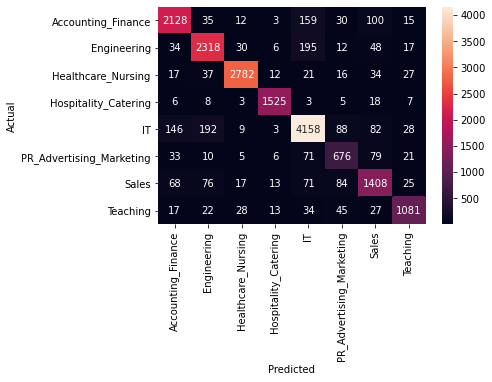

In [ ]:
conf_mat = confusion_matrix(y_test, y_pred)
conf_mat

categories = sorted(list(set(labels))) # this gives sorted set of unique label names

sns.heatmap(conf_mat, annot=True, fmt='d',
            xticklabels=categories, yticklabels=categories) # creates a heatmap from the confusion matrix
plt.ylabel('Actual')
plt.xlabel('Predicted')

### To make the results robust we will use k-fold cross validation

In [ ]:
from sklearn.model_selection import KFold
num_folds = 5
kf = KFold(n_splits= num_folds, random_state=seed, shuffle = True) # initialise a 5 fold validation
print(kf)


KFold(n_splits=5, random_state=0, shuffle=True)


In [ ]:
def evaluate(X_train, X_test, y_train, y_test, seed, type_model=None):
    
    if type_model == "count_vec":
        model = LogisticRegression(random_state=seed)
           
    else:
        model = LogisticRegression(max_iter = 1000,random_state=seed)
        
    model.fit(X_train, y_train)         
    return model.score(X_test, y_test)

#### Document classification using Bag of words model, FastText, pre-trained Word2Vec,  pre-trained Glove

In [ ]:
num_models = 7
df_models_performance_combine = pd.DataFrame(columns = ['count_combine', 'fastText_unweigh_combine','fastText_weigh_combine', 'word2vec_unweigh_combine', 'word2vec_weigh_combine'], index=range(num_folds)) 


fold = 0
for train_index, test_index in kf.split(list(range(0,len(labels)))):
    
    y_train = [labels[i] for i in train_index]
    y_test = [labels[i] for i in test_index]
    
    
    X_train_count, X_test_count = count_features[train_index], count_features[test_index]
    df_models_performance_combine.loc[fold,'count_combine'] = evaluate(count_features[train_index],count_features[test_index],
                                                       y_train, y_test, seed, type_model="count_vec")

    
    X_train_count, X_test_count = jobAdFT_dvs.loc[train_index], jobAdFT_dvs.loc[test_index]
    df_models_performance_combine.loc[fold,'fastText_unweigh_combine'] = evaluate(jobAdFT_dvs.loc[train_index], jobAdFT_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    X_train_count, X_test_count = weighted_jobAdFT_dvs.loc[train_index], weighted_jobAdFT_dvs.loc[test_index]
    df_models_performance_combine.loc[fold,'fastText_weigh_combine'] = evaluate(weighted_jobAdFT_dvs.loc[train_index], weighted_jobAdFT_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
#     X_train_count, X_test_count = preTW2v_dvs.loc[train_index], preTW2v_dvs.loc[test_index]
#     df_models_performance_combine.loc[fold,'word2vec_unweigh_combine'] = evaluate(preTW2v_dvs.loc[train_index], preTW2v_dvs.loc[test_index],
#                                                   y_train, y_test, seed)
    
    
    X_train_count, X_test_count = weighted_preTW2v_dvs.loc[train_index], weighted_preTW2v_dvs.loc[test_index]
    df_models_performance_combine.loc[fold,'word2vec_weigh_combine'] = evaluate(weighted_preTW2v_dvs.loc[train_index], weighted_preTW2v_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    
    
    fold +=1
    
    
    
    

/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

In [ ]:
fold = 0
for train_index, test_index in kf.split(list(range(0,len(labels)))):
    
    y_train = [labels[i] for i in train_index]
    y_test = [labels[i] for i in test_index]
    
    X_train_count, X_test_count = preTW2v_dvs.loc[train_index], preTW2v_dvs.loc[test_index]
    df_models_performance_combine.loc[fold,'word2vec_unweigh_combine'] = evaluate(preTW2v_dvs.loc[train_index], preTW2v_dvs.loc[test_index],
                                                  y_train, y_test, seed)
    fold += 1
    

/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/bhartisinha/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

In [ ]:
df_models_performance_combine

,count_combine,fastText_unweigh_combine,fastText_weigh_combine,word2vec_unweigh_combine,word2vec_weigh_combine
0,0.87872,0.868891,0.863481,0.857439,0.814247
1,0.879531,0.872227,0.866005,0.857259,0.817854
2,0.875564,0.869793,0.868801,0.857349,0.817223
3,0.874121,0.869071,0.868801,0.854283,0.806943
4,0.876364,0.877266,0.868428,0.861484,0.821174


In [ ]:
df_models_performance_combine.to_csv("model_performance_combine")

## <span style='font-family:Georgia;color:Blue;background:yellow'> Observation
    
<span style='font-family:Georgia;color:Blue;background:lightgreen'>Question 2. Does more information provide higher accuracy?
    
<span style='font-family:Georgia;color:Blue;background:lightblue'>Answer:</span>
    
2. As observed using only title, bag of words model reached the highest accuracy of 75% whereas using only descriptions or description and title combined reach highest accuracy with bag of words model at 87%. 
    
    
2. Using only titles for classification perform worse than using description and title and description combined.
    
    
3. Using Description combined with Title does not give any improvement over document classification using description alone. This is evident from the observation:
    
    ### Results
  
    
        |                          | Only Description | Description and Title | only Title 
        |--------------------------|------------------|-----------------------|---------------|
        |      count               | 87               | 87                    |75             |
        | -------------------      | -----------------| ----------------------|---------------|
        |fastText unweighted       | 86               | 87                    |66             |
        | -------------------      | -----------------| ----------------------|---------------|
        |fastText   weighted       | 87               | 86                    |76             |
        | -------------------      | -----------------| ----------------------|---------------|
        |GoogleNews300 unweighted  | 85               | 85                    |70             |
        | -------------------      | -----------------| ----------------------|---------------|
        |GoogleNews300 weighted    | 87               | 81                    |73             |
    
 
 
    

# <span style='font-family:Georgia;color:Blue;background:Yellow'>Conclusion 
    
Q. Which language model we built previously (based on job advertisement descriptions) performs the best with the chosen machine learning model?
    

<span style='font-family:Georgia;color:Blue;background:lightblue'>Answer:</span>
    
After running Logistic regression for classification over 5-fold cross validation the results indicate that bag of words model performs the best, followed closely by weighted FastText and unweighted FastText. Next, Weighted GoogleNews300 performs better than unweighted GoogleNews300 model. Glove's accuracy is the least amongst all as observed from the TSE plots as well. 
    
    
Ranking:
    
    1. Bag of words --> approximately 87%
    2. weighted FastText  --> approximately 87%
    3. unweighted FastText --> approximately 86%
    4. Weighted GoogleNews300 --> approx 86%
    5. unweighted GoogleNews300 model --> approx 85%
    6. glove unweighted ---> 83.5%
    7. glove weighted  ---> 83%
    
    
The difference in the accuracy of weighted and unweighted of all respective models is very small. 